# Brain Tumor Classification

## Clone the Github Repo to access the Dataset

In [1]:
!git clone https://github.com/Ashish-Arya-CS/Coursera-Content.git

Cloning into 'Coursera-Content'...
remote: Enumerating objects: 3049, done.
remote: Counting objects: 100% (6/6), done.
remote: Compressing objects: 100% (4/4), done.
remote: Total 3049 (delta 1), reused 6 (delta 1), pack-reused 3043 (from 1)
Receiving objects: 100% (3049/3049), 79.25 MiB | 43.08 MiB/s, done.
Resolving deltas: 100% (1/1), done.


## Import necessary libraries

In [2]:
!pip install pydot graphviz

In [3]:

import os
import random
from tqdm import tqdm
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import cv2
import random
from IPython.display import Image
import imutils   

from sklearn.metrics import accuracy_score, confusion_matrix, ConfusionMatrixDisplay, classification_report

import keras
import tensorflow.keras as K

import tensorflow as tf
from tensorflow.keras.preprocessing.image import load_img, ImageDataGenerator, array_to_img, img_to_array
from tensorflow.keras.applications import EfficientNetB1
from tensorflow.keras.models import Model
from tensorflow.keras.layers import Flatten, Dense, Conv2D, Dropout, GlobalAveragePooling2D
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.callbacks import ModelCheckpoint, EarlyStopping, ReduceLROnPlateau
import imutils  
from tensorflow.keras.utils import plot_model

## Creating Directories to store Cropped Images

In [4]:
#create directory for training data
os.mkdir('/kaggle/working/training_data')
os.mkdir('/kaggle/working/training_data/glioma_tumor')
os.mkdir('/kaggle/working/training_data/meningioma_tumor')
os.mkdir('/kaggle/working/training_data/pituitary_tumor')
os.mkdir('/kaggle/working/training_data/no_tumor')

In [5]:
#create directory for testing data
os.mkdir('/kaggle/working/testing_data')
os.mkdir('/kaggle/working/testing_data/glioma_tumor')
os.mkdir('/kaggle/working/testing_data/meningioma_tumor')
os.mkdir('/kaggle/working/testing_data/pituitary_tumor')
os.mkdir('/kaggle/working/testing_data/no_tumor')

## Data Visualization

In [6]:
#specify directory
train_dir = '/kaggle/working/Coursera-Content/Brain-MRI/Training/'
test_dir = '/kaggle/working/Coursera-Content/Brain-MRI/Testing/'

In [7]:
#create classes
classes = os.listdir('/kaggle/working/Coursera-Content/Brain-MRI/Training')

classes

['no_tumor', 'pituitary_tumor', 'glioma_tumor', 'meningioma_tumor']

In [8]:
files_path_dict = {}

for c in classes:
    class_dir = os.path.join(train_dir, c)
    files_path_dict[c] = list(map(lambda x: os.path.join(class_dir, x), os.listdir(class_dir)))

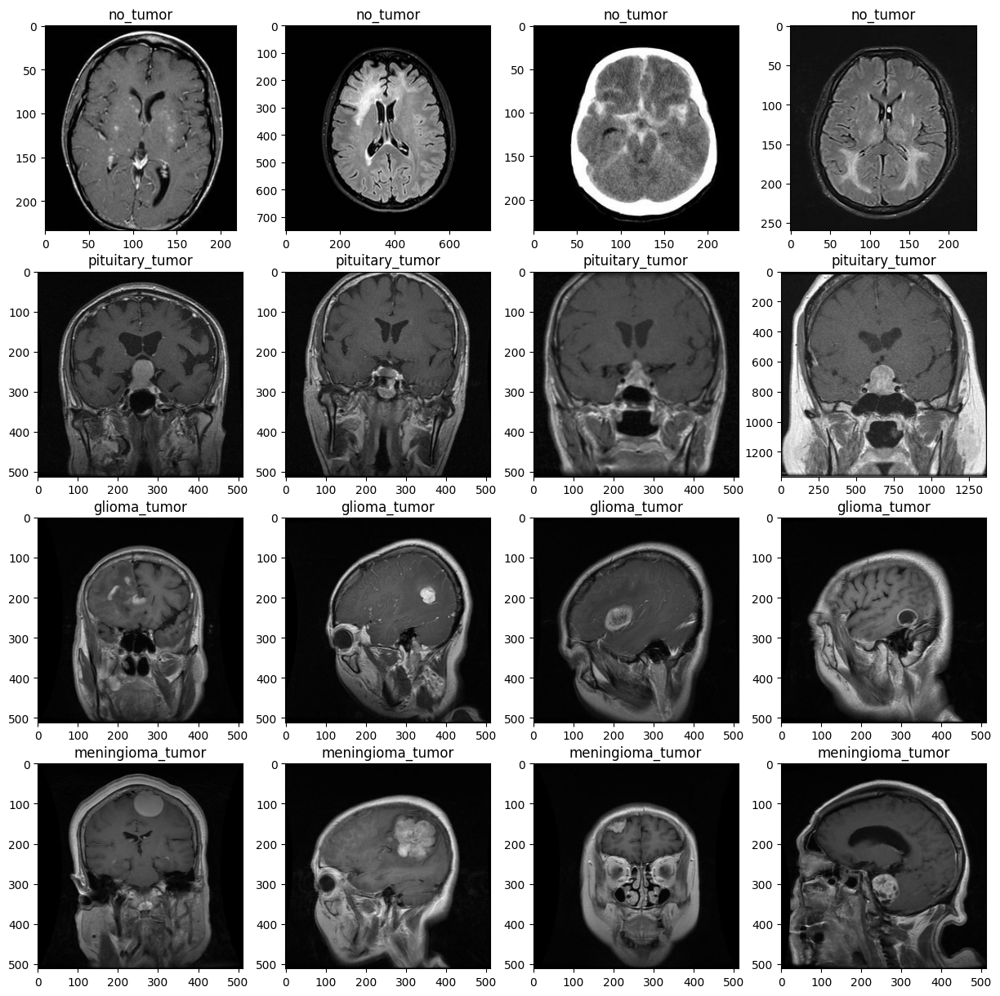

In [9]:
plt.figure(figsize = (15,15))
index = 0
for c in classes:
  random.shuffle(files_path_dict[c])
  path_list = files_path_dict[c][:5]

  for i in range(1, 5):
    index += 1
    plt.subplot(4, 4, index)
    plt.imshow(load_img(path_list[i]))
    plt.title(c)

In [10]:
#check the number of images in each class in the training dataset
No_images_per_class = []
Class_name = []

for i in os.listdir('/kaggle/working/Coursera-Content/Brain-MRI/Training'):
  train_class = os.listdir(os.path.join('/kaggle/working/Coursera-Content/Brain-MRI/Training', i))
  No_images_per_class.append(len(train_class))
  Class_name.append(i)
  print('Number of images in {} = {} \n'.format(i, len(train_class)))

Number of images in no_tumor = 501 

Number of images in pituitary_tumor = 901 

Number of images in glioma_tumor = 926 

Number of images in meningioma_tumor = 937 



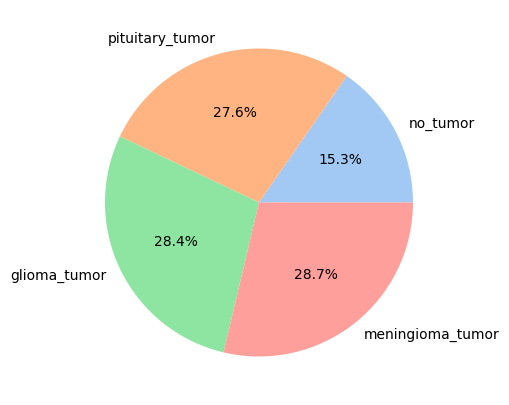

In [11]:
#visualize class distribution in train set
plt.figure(figsize=(5, 5))
colors = sns.color_palette('pastel')
plt.pie(No_images_per_class, 
        labels = Class_name, 
        autopct = '%1.1f%%',
        colors=colors)
plt.show()

## Create a Function to Crop Images

In [12]:
def crop_image(image, plot=False):
    
    #convert to grayscale
    img_gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)

    #blur
    img_gray = cv2.GaussianBlur(img_gray, (5, 5), 0)
    
    #apply binary threshhold
    img_thresh = cv2.threshold(img_gray, 45, 255, cv2.THRESH_BINARY)[1]

    #apply erosion
    img_thresh = cv2.erode(img_thresh, None, iterations=2)

    #dilate images
    img_thresh = cv2.dilate(img_thresh, None, iterations=2)

    #find shapes or the contour of images
    contours = cv2.findContours(img_thresh.copy(), cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)

    #grab contours
    contours = imutils.grab_contours(contours)

    #find biggest contour
    c = max(contours, key=cv2.contourArea)

    #extract contour positions
    extLeft = tuple(c[c[:, :, 0].argmin()][0])
    extRight = tuple(c[c[:, :, 0].argmax()][0])
    extTop = tuple(c[c[:, :, 1].argmin()][0])
    extBot = tuple(c[c[:, :, 1].argmax()][0])
    
    #generate new image
    new_image = image[extTop[1]:extBot[1], extLeft[0]:extRight[0]]

    #plot
    if plot:
        plt.figure(figsize=(15, 6))
        plt.subplot(1, 2, 1)
        plt.imshow(image)
        plt.tick_params(axis='both', which='both', top=False, bottom=False, left=False, right=False,labelbottom=False, labeltop=False, labelleft=False, labelright=False)
        plt.title('Original Image')
        plt.subplot(1, 2, 2)
        plt.imshow(new_image)
        plt.tick_params(axis='both', which='both',top=False, bottom=False, left=False, right=False,labelbottom=False, labeltop=False, labelleft=False, labelright=False)
        plt.title('Cropped Image')
        plt.show()
    
    return new_image

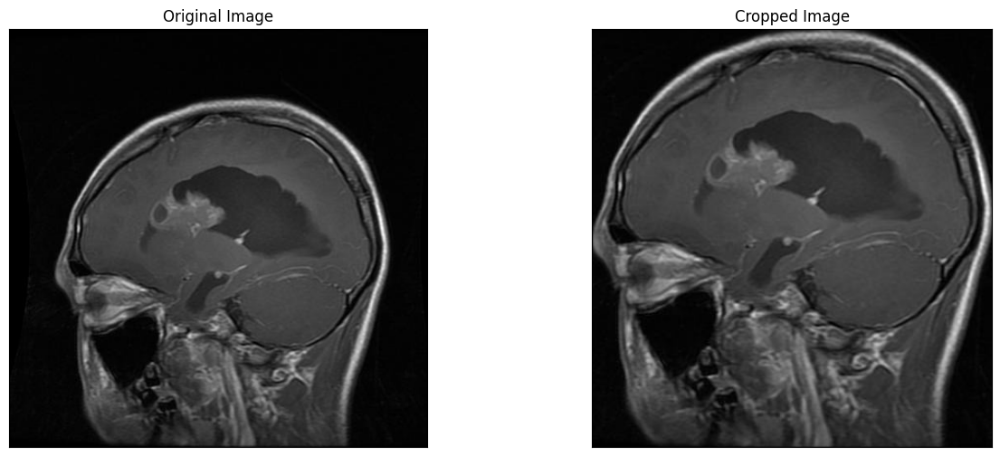

In [13]:
example_image = cv2.imread('/kaggle/working/Coursera-Content/Brain-MRI/Training/glioma_tumor/gg (60).jpg')
cropped_image = crop_image(example_image, plot=True)

## Saving The Cropped Images

In [14]:
#crop training images and save it to the directory we previously created
glioma = train_dir + 'glioma_tumor'
meningioma = train_dir + 'meningioma_tumor'
pituitary = train_dir + 'pituitary_tumor'
no_tumor = train_dir + 'no_tumor'

j = 0
for i in tqdm(os.listdir(glioma)):
  path = os.path.join(glioma, i)
  img = cv2.imread(path)
  img = crop_image(img, plot=False)

  if img is not None:
    img = cv2.resize(img, (240, 240))
    save_path = '/kaggle/working/training_data/glioma_tumor/' + str(j) + '.jpg'
    cv2.imwrite(save_path, img)
    j = j + 1

j = 0
for i in tqdm(os.listdir(meningioma)):
  path = os.path.join(meningioma, i)
  img = cv2.imread(path)
  img = crop_image(img, plot=False)

  if img is not None:
    img = cv2.resize(img, (240, 240))
    save_path = '/kaggle/working/training_data/meningioma_tumor/' + str(j) + '.jpg'
    cv2.imwrite(save_path, img)
    j = j + 1  

j = 0
for i in tqdm(os.listdir(pituitary)):
  path = os.path.join(pituitary, i)
  img = cv2.imread(path)
  img = crop_image(img, plot=False)

  if img is not None:
    img = cv2.resize(img, (240, 240))
    save_path = '/kaggle/working/training_data/pituitary_tumor/' + str(j) + '.jpg'
    cv2.imwrite(save_path, img)
    j = j + 1  

j = 0
for i in tqdm(os.listdir(no_tumor)):
  path = os.path.join(no_tumor, i)
  img = cv2.imread(path)
  img = crop_image(img, plot=False)

  if img is not None:
    img = cv2.resize(img, (240, 240))
    save_path = '/kaggle/working/training_data/no_tumor/' + str(j) + '.jpg'
    cv2.imwrite(save_path, img)
    j = j + 1  

100%|██████████| 501/501 [00:01<00:00, 356.18it/s]


In [15]:
#crop testing images and save it to the directory we previously created
test_glioma = test_dir + 'glioma_tumor'
test_meningioma = test_dir + 'meningioma_tumor'
test_pituitary = test_dir + 'pituitary_tumor'
test_no_tumor = test_dir + 'no_tumor'

j = 0
for i in tqdm(os.listdir(test_glioma)):
  path = os.path.join(test_glioma, i)
  img = cv2.imread(path)
  img = crop_image(img, plot=False)

  if img is not None:
    img = cv2.resize(img, (240, 240))
    save_path = '/kaggle/working/testing_data/glioma_tumor/' + str(j) + '.jpg'
    cv2.imwrite(save_path, img)
    j = j + 1

j = 0
for i in tqdm(os.listdir(test_meningioma)):
  path = os.path.join(test_meningioma, i)
  img = cv2.imread(path)
  img = crop_image(img, plot=False)

  if img is not None:
    img = cv2.resize(img, (240, 240))
    save_path = '/kaggle/working/testing_data/meningioma_tumor/' + str(j) + '.jpg'
    cv2.imwrite(save_path, img)
    j = j + 1  

j = 0
for i in tqdm(os.listdir(test_pituitary)):
  path = os.path.join(test_pituitary, i)
  img = cv2.imread(path)
  img = crop_image(img, plot=False)

  if img is not None:
    img = cv2.resize(img, (240, 240))
    save_path = '/kaggle/working/testing_data/pituitary_tumor/' + str(j) + '.jpg'
    cv2.imwrite(save_path, img)
    j = j + 1  

j = 0
for i in tqdm(os.listdir(test_no_tumor)):
  path = os.path.join(test_no_tumor, i)
  img = cv2.imread(path)
  img = crop_image(img, plot=False)

  if img is not None:
    img = cv2.resize(img, (240, 240))
    save_path = '/kaggle/working/testing_data/no_tumor/' + str(j) + '.jpg'
    cv2.imwrite(save_path, img)
    j = j + 1 

100%|██████████| 5/5 [00:00<00:00, 430.27it/s]


## Data Augmentation

In [16]:
#use Image Data Generator to perform this task
#train set
datagen = ImageDataGenerator(rotation_range=10,
                             height_shift_range=0.2,
                             horizontal_flip=True,
                             validation_split=0.2)

train_data = datagen.flow_from_directory('/kaggle/working/training_data',
                                         target_size=(240, 240),
                                         batch_size=32,
                                         class_mode='categorical',
                                         subset='training')

valid_data = datagen.flow_from_directory('/kaggle/working/training_data',
                                         target_size=(240, 240),
                                         batch_size=32,
                                         class_mode='categorical',
                                         subset='validation')

#test set
test_datagen = ImageDataGenerator()

test_data = datagen.flow_from_directory('/kaggle/working/testing_data',
                                         target_size=(240, 240),
                                        class_mode='categorical',
                                        shuffle=False)

Found 2613 images belonging to 4 classes.
Found 652 images belonging to 4 classes.
Found 20 images belonging to 4 classes.


In [17]:
# In thông tin nhóm (class)
print("Các nhóm (classes) trong tập train:")
print(train_data.class_indices)  # Tên các nhóm và chỉ số tương ứng

# Số lượng ảnh theo từng nhóm
class_counts = {class_name: 0 for class_name in train_data.class_indices.keys()}

for class_label in train_data.classes:
    class_name = list(train_data.class_indices.keys())[list(train_data.class_indices.values()).index(class_label)]
    class_counts[class_name] += 1

print("\nSố lượng ảnh trong từng nhóm:")
for class_name, count in class_counts.items():
    print(f"- {class_name}: {count} ảnh")


Các nhóm (classes) trong tập train:
{'glioma_tumor': 0, 'meningioma_tumor': 1, 'no_tumor': 2, 'pituitary_tumor': 3}

Số lượng ảnh trong từng nhóm:
- glioma_tumor: 741 ảnh
- meningioma_tumor: 750 ảnh
- no_tumor: 401 ảnh
- pituitary_tumor: 721 ảnh


In [18]:
# In thông tin nhóm (class)
print("Các nhóm (classes) trong tập val:")
print(valid_data.class_indices)  # Tên các nhóm và chỉ số tương ứng

# Số lượng ảnh theo từng nhóm
class_counts = {class_name: 0 for class_name in valid_data.class_indices.keys()}

for class_label in valid_data.classes:
    class_name = list(valid_data.class_indices.keys())[list(valid_data.class_indices.values()).index(class_label)]
    class_counts[class_name] += 1

print("\nSố lượng ảnh trong từng nhóm:")
for class_name, count in class_counts.items():
    print(f"- {class_name}: {count} ảnh")

Các nhóm (classes) trong tập val:
{'glioma_tumor': 0, 'meningioma_tumor': 1, 'no_tumor': 2, 'pituitary_tumor': 3}

Số lượng ảnh trong từng nhóm:
- glioma_tumor: 185 ảnh
- meningioma_tumor: 187 ảnh
- no_tumor: 100 ảnh
- pituitary_tumor: 180 ảnh


In [19]:
#view the class dictionary
print(train_data.class_indices)
print(test_data.class_indices)

{'glioma_tumor': 0, 'meningioma_tumor': 1, 'no_tumor': 2, 'pituitary_tumor': 3}
{'glioma_tumor': 0, 'meningioma_tumor': 1, 'no_tumor': 2, 'pituitary_tumor': 3}


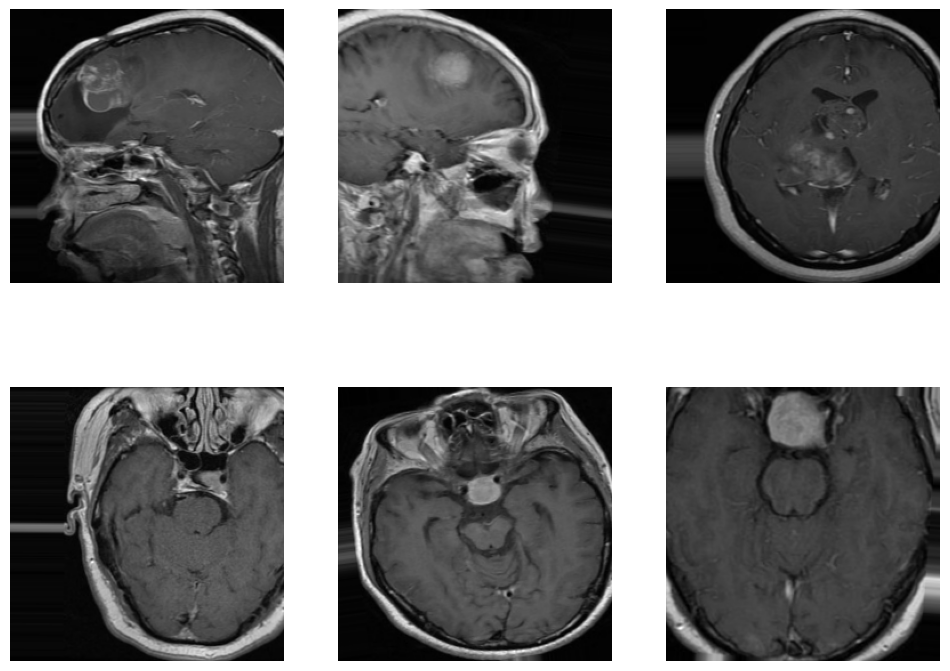

In [20]:
#view the augmented data
sample_x, sample_y = next(train_data)
plt.figure(figsize=(12, 9))
for i in range(6):
  plt.subplot(2, 3, i+1)
  sample = array_to_img(sample_x[i])
  plt.axis('off')
  plt.grid(False)
  plt.imshow(sample)
plt.show()

## Model Architecture

In [21]:
# Load EfficientNetB1
base_model = EfficientNetB1(weights='imagenet', include_top=False, input_shape=(240, 240, 3))

# Freeze base model layers
# for layer in base_model.layers:
#    layer.trainable = False

# Add custom classification head
x = base_model.output
x = GlobalAveragePooling2D()(x)
x = Dropout(0.5)(x)
output = Dense(4, activation='softmax')(x)

model = Model(inputs=base_model.input, outputs=output)

# Display model summary
model.summary()

27018416/27018416 ━━━━━━━━━━━━━━━━━━━━ 0s 0us/step


Model: "functional"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)              ┃ Output Shape           ┃        Param # ┃ Connected to           ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━┩
│ input_layer (InputLayer)  │ (None, 240, 240, 3)    │              0 │ -                      │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ rescaling (Rescaling)     │ (None, 240, 240, 3)    │              0 │ input_layer[0][0]      │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ normalization             │ (None, 240, 240, 3)    │              7 │ rescaling[0][0]        │
│ (Normalization)           │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ rescaling_1 (Rescaling)   │ (None, 240, 240, 3)    │              0 │ normalization[0][0]    │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ stem_conv_pad             │ (None, 241, 241, 3)    │              0 │ rescaling_1[0][0]      │
│ (ZeroPadding2D)           │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ stem_conv (Conv2D)        │ (None, 120, 120, 32)   │            864 │ stem_conv_pad[0][0]    │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ stem_bn                   │ (None, 120, 120, 32)   │            128 │ stem_conv[0][0]        │
│ (BatchNormalization)      │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ stem_activation           │ (None, 120, 120, 32)   │              0 │ stem_bn[0][0]          │
│ (Activation)              │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ block1a_dwconv            │ (None, 120, 120, 32)   │            288 │ stem_activation[0][0]  │
│ (DepthwiseConv2D)         │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ block1a_bn                │ (None, 120, 120, 32)   │            128 │ block1a_dwconv[0][0]   │
│ (BatchNormalization)      │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ block1a_activation        │ (None, 120, 120, 32)   │              0 │ block1a_bn[0][0]       │
│ (Activation)              │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ block1a_se_squeeze        │ (None, 32)             │              0 │ block1a_activation[0]… │
│ (GlobalAveragePooling2D)  │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ block1a_se_reshape        │ (None, 1, 1, 32)       │              0 │ block1a_se_squeeze[0]… │
│ (Reshape)                 │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ block1a_se_reduce         │ (None, 1, 1, 8)        │            264 │ block1a_se_reshape[0]… │
│ (Conv2D)                  │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ block1a_se_expand    

 Total params: 6,580,363 (25.10 MB)

 Trainable params: 6,518,308 (24.87 MB)

 Non-trainable params: 62,055 (242.41 KB)

dot: graph is too large for cairo-renderer bitmaps. Scaling by 0.286786 to fit



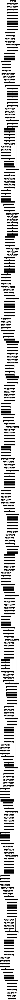

In [22]:

plot_model(model, to_file='model_architecture.png', show_shapes=True, show_layer_names=True)

## Compile Model

In [23]:
#define checkpoint
checkpoint = ModelCheckpoint('model.keras', 
                             monitor='val_accuracy',
                             save_best_only=True,
                             mode='auto',
                             verbose=1)

#early stopping
earlystop = EarlyStopping(monitor='val_accuracy',
                          patience=5,
                          mode='auto',
                          verbose=1)

#reduce learning rate
reduce_lr = ReduceLROnPlateau(monitor='val_accuracy', 
                              factor=0.3, 
                              patience=2, 
                              min_delta=0.001,
                              mode='auto',
                              verbose=1)

#compile model
model.compile(optimizer=Adam(learning_rate=0.0001),
              loss='categorical_crossentropy',
              metrics=['accuracy'])


## Model training and model evaluation

In [24]:
%%time

#train the model
history = model.fit(train_data,
                    epochs = 30,
                    validation_data=valid_data,
                    verbose=1,
                    callbacks=[checkpoint, earlystop, reduce_lr])


Epoch 1/30


/usr/local/lib/python3.10/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


82/82 ━━━━━━━━━━━━━━━━━━━━ 0s 1s/step - accuracy: 0.5424 - loss: 1.0590
Epoch 1: val_accuracy improved from -inf to 0.58896, saving model to model.keras
82/82 ━━━━━━━━━━━━━━━━━━━━ 221s 1s/step - accuracy: 0.5441 - loss: 1.0558 - val_accuracy: 0.5890 - val_loss: 1.1527 - learning_rate: 1.0000e-04
Epoch 2/30
82/82 ━━━━━━━━━━━━━━━━━━━━ 0s 344ms/step - accuracy: 0.8844 - loss: 0.3518
Epoch 2: val_accuracy improved from 0.58896 to 0.66411, saving model to model.keras
82/82 ━━━━━━━━━━━━━━━━━━━━ 39s 446ms/step - accuracy: 0.8845 - loss: 0.3514 - val_accuracy: 0.6641 - val_loss: 0.8207 - learning_rate: 1.0000e-04
Epoch 3/30
82/82 ━━━━━━━━━━━━━━━━━━━━ 0s 344ms/step - accuracy: 0.9194 - loss: 0.2194
Epoch 3: val_accuracy improved from 0.66411 to 0.77301, saving model to model.keras
82/82 ━━━━━━━━━━━━━━━━━━━━ 39s 447ms/step - accuracy: 0.9196 - loss: 0.2191 - val_accuracy: 0.7730 - val_loss: 0.5345 - learning_rate: 1.0000e-04
Epoch 4/30
82/82 ━━━━━━━━━━━━━━━━━━━━ 0s 352ms/step - accuracy: 0.9491 

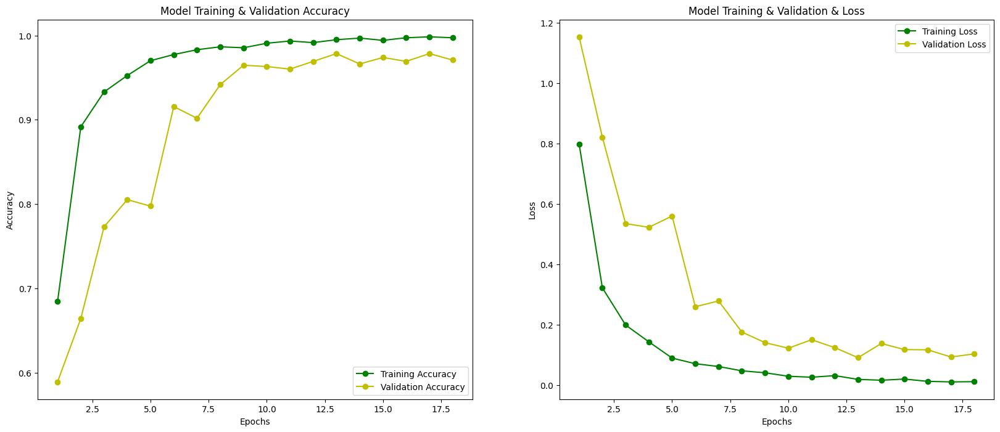

In [25]:
fig , ax = plt.subplots(1,2)
fig.set_size_inches(20, 8)

train_acc = history.history['accuracy']
train_loss = history.history['loss']
val_acc = history.history['val_accuracy']
val_loss = history.history['val_loss']

epochs = range(1, len(train_acc) + 1)

ax[0].plot(epochs , train_acc , 'g-o' , label = 'Training Accuracy')
ax[0].plot(epochs , val_acc , 'y-o' , label = 'Validation Accuracy')
ax[0].set_title('Model Training & Validation Accuracy')
ax[0].legend(loc = 'lower right')
ax[0].set_xlabel("Epochs")
ax[0].set_ylabel("Accuracy")

ax[1].plot(epochs , train_loss , 'g-o' , label = 'Training Loss')
ax[1].plot(epochs , val_loss , 'y-o' , label = 'Validation Loss')
ax[1].set_title('Model Training & Validation & Loss')
ax[1].legend()
ax[1].set_xlabel("Epochs")
ax[1].set_ylabel("Loss")

plt.show()

In [26]:
# Evaluate the model on train and test data
print('Train accuracy & loss:', model.evaluate(train_data))
print('\n')
print('Test accuracy & loss:', model.evaluate(test_data))

82/82 ━━━━━━━━━━━━━━━━━━━━ 33s 396ms/step - accuracy: 1.0000 - loss: 7.3824e-04
Train accuracy & loss: [0.0008558197878301144, 1.0]


1/1 ━━━━━━━━━━━━━━━━━━━━ 9s 9s/step - accuracy: 1.0000 - loss: 0.0152
Test accuracy & loss: [0.015160744078457355, 1.0]


1/1 ━━━━━━━━━━━━━━━━━━━━ 7s 7s/step


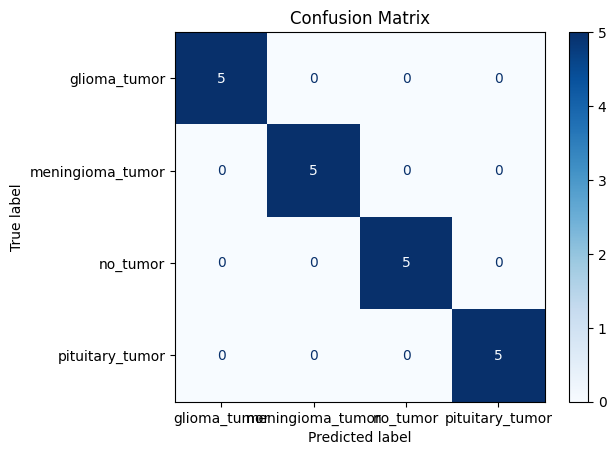

              precision    recall  f1-score   support

           0       1.00      1.00      1.00         5
           1       1.00      1.00      1.00         5
           2       1.00      1.00      1.00         5
           3       1.00      1.00      1.00         5

    accuracy                           1.00        20
   macro avg       1.00      1.00      1.00        20
weighted avg       1.00      1.00      1.00        20



In [27]:
#define labels for testing
y_test = test_data.classes

#make prediction
yhat_test = np.argmax(model.predict(test_data), axis=1)

cm = confusion_matrix(y_test, yhat_test)

# Define class labels
class_names = list(test_data.class_indices.keys())  # Lấy tên lớp từ test_data

# Display confusion matrix
disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=class_names)
disp.plot(cmap=plt.cm.Blues)  # Sử dụng colormap
plt.title('Confusion Matrix')
plt.show()

#get classification report
print(classification_report(y_test, yhat_test))

## Obtaining Predictions on Test Images

In [28]:
import PIL

class_dict = {0: 'glioma_tumor',
              1: 'meningioma_tumor',
              2: 'no_tumor',
              3: 'pituitary_tumor'}
              
prediction = []
original = []
image = []
count = 0
for i in os.listdir('/kaggle/working/testing_data'):
  for item in os.listdir(os.path.join('/kaggle/working/testing_data', i)):
    # code to open the image
    img= PIL.Image.open(os.path.join('/kaggle/working/testing_data', i, item))
    #append to image list
    image.append(img)
    #expand dimension
    img = np.expand_dims(img, axis=0)
    #predict
    predict = model.predict(img)
    #get the index corresponding to the highest value in the prediction
    predict = np.argmax(predict)
    #append the predicted class to the list
    prediction.append(class_dict[predict])
    #append original class to the list
    original.append(i)

1/1 ━━━━━━━━━━━━━━━━━━━━ 9s 9s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step


In [29]:

#test accuracy 
score = accuracy_score(original, prediction)
print("Test Accuracy : {}".format(score))

Test Accuracy : 1.0


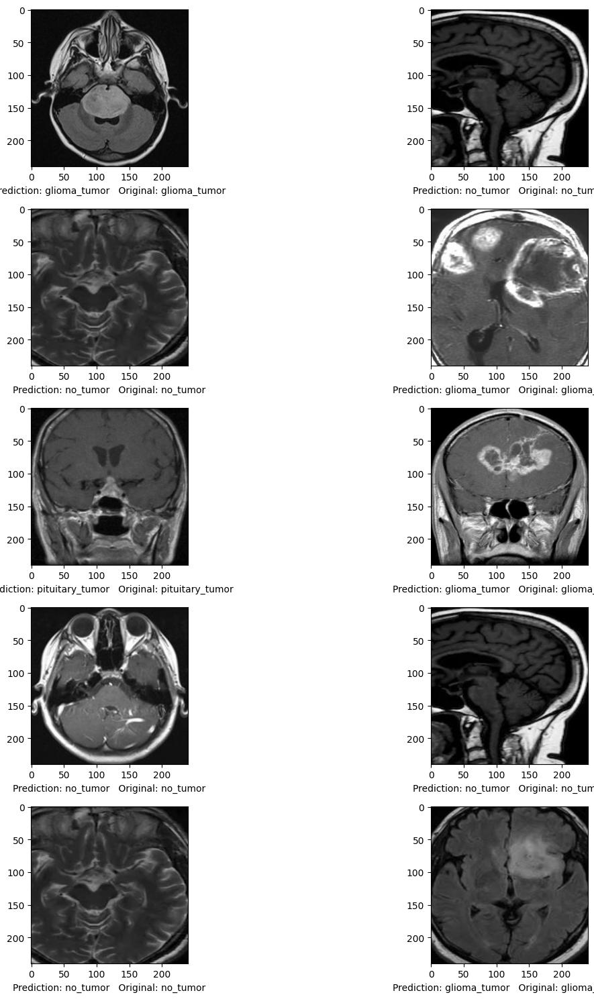

In [30]:
# Visualize the results
fig = plt.figure(figsize=(15, 15))
for i in range(10):
    j = random.randint(0, len(image) - 1) 
    fig.add_subplot(5, 2, i + 1)
    plt.xlabel(f"Prediction: {prediction[j]}   Original: {original[j]}")
    plt.imshow(image[j])
fig.tight_layout()
plt.show()

In [31]:
def VizCAM(model, image, interpolant=0.5, plot_results=True):
    """VizCAM - Displays Class Activation Map (CAM) for Keras / TensorFlow models.
    Parameters:
    model (keras.Model): Compiled Model with Weights Loaded
    image: Image to Perform Inference On
    interpolant (float): Blend ratio for superimposed heatmap
    plot_results (boolean): True - Display image with heatmap
                            False - Return heatmap
    """
    # Step 1: Preprocess image and predict
    original_img = np.asarray(image, dtype=np.float32)
    img = np.expand_dims(original_img, axis=0)  # Add batch dimension
    prediction = model.predict(img)
    prediction_idx = np.argmax(prediction)  # Class index of top prediction

    # Step 2: Identify the last Conv2D layer
    last_conv_layer = next(x for x in model.layers[::-1] if isinstance(x, K.layers.Conv2D))
    target_layer = model.get_layer(last_conv_layer.name)

    # Step 3: Create a new model to extract feature maps and class weights
    cam_model = Model(inputs=model.input, outputs=[target_layer.output, model.output])
    feature_maps, predictions = cam_model(img)

    # Extract class weights
    class_weights = model.layers[-1].get_weights()[0]  # Weights of the Dense layer

    # Step 4: Compute the Class Activation Map (CAM)
    cam = np.dot(feature_maps[0], class_weights[:, prediction_idx])

    # Resize CAM to match original image size
    cam = cv2.resize(cam, (original_img.shape[1], original_img.shape[0]))

    # Normalize CAM to range [0, 1]
    cam = np.maximum(cam, 0)  # Ensure no negative values
    cam = (cam - cam.min()) / (cam.max() - cam.min())
    cam = np.uint8(255 * cam)

    # Step 5: Convert to heatmap and overlay
    heatmap = cv2.applyColorMap(cam, cv2.COLORMAP_JET)
    original_img = np.uint8((original_img - original_img.min()) / (original_img.max() - original_img.min()) * 255)
    cvt_heatmap = cv2.cvtColor(heatmap, cv2.COLOR_BGR2RGB)
    cvt_heatmap = img_to_array(cvt_heatmap)

    # Enlarge plot
    plt.rcParams["figure.dpi"] = 100

    if plot_results:
        plt.imshow(np.uint8(original_img * interpolant + cvt_heatmap * (1 - interpolant)))
        plt.title("Class Activation Map (CAM)")
        plt.axis('off')
        plt.show()
    else:
        return cvt_heatmap


In [32]:
#https://github.com/gkeechin/vizgradcam/blob/main/gradcam.py

def VizGradCAM(model, image, interpolant=0.5, plot_results=True):

    """VizGradCAM - Displays GradCAM based on Keras / TensorFlow models
    using the gradients from the last convolutional layer. This function
    should work with all Keras Application listed here:
    https://keras.io/api/applications/
    Parameters:
    model (keras.model): Compiled Model with Weights Loaded
    image: Image to Perform Inference On
    plot_results (boolean): True - Function Plots using PLT
                            False - Returns Heatmap Array
    Returns:
    Heatmap Array?
    """
    #sanity check
    assert (interpolant > 0 and interpolant < 1), "Heatmap Interpolation Must Be Between 0 - 1"

    #STEP 1: Preprocesss image and make prediction using our model
    #input image
    original_img = np.asarray(image, dtype = np.float32)
    #expamd dimension and get batch size
    img = np.expand_dims(original_img, axis=0)
    #predict
    prediction = model.predict(img)
    #prediction index
    prediction_idx = np.argmax(prediction)

    #STEP 2: Create new model
    #specify last convolutional layer
    last_conv_layer = next(x for x in model.layers[::-1] if isinstance(x, K.layers.Conv2D))
    target_layer = model.get_layer(last_conv_layer.name)

    #compute gradient of top predicted class
    with tf.GradientTape() as tape:
        #create a model with original model inputs and the last conv_layer as the output
        gradient_model = Model([model.inputs], [target_layer.output, model.output])
        #pass the image through the base model and get the feature map  
        conv2d_out, prediction = gradient_model(img)
        #prediction loss
        loss = prediction[:, prediction_idx]

    #gradient() computes the gradient using operations recorded in context of this tape
    gradients = tape.gradient(loss, conv2d_out)

    #obtain the output from shape [1 x H x W x CHANNEL] -> [H x W x CHANNEL]
    output = conv2d_out[0]

    #obtain depthwise mean
    weights = tf.reduce_mean(gradients[0], axis=(0, 1))


    #create a 7x7 map for aggregation
    activation_map = np.zeros(output.shape[0:2], dtype=np.float32)
    #multiply weight for every layer
    for idx, weight in enumerate(weights):
        activation_map += weight * output[:, :, idx]
    #resize to image size
    activation_map = cv2.resize(activation_map.numpy(), 
                                (original_img.shape[1], 
                                 original_img.shape[0]))
    #ensure no negative number
    activation_map = np.maximum(activation_map, 0)
    #convert class activation map to 0 - 255
    activation_map = (activation_map - activation_map.min()) / (activation_map.max() - activation_map.min())
    #rescale and convert the type to int
    activation_map = np.uint8(255 * activation_map)


    #convert to heatmap
    heatmap = cv2.applyColorMap(activation_map, cv2.COLORMAP_JET)

    #superimpose heatmap onto image  
    original_img = np.uint8((original_img - original_img.min()) / (original_img.max() - original_img.min()) * 255)
    cvt_heatmap = cv2.cvtColor(heatmap, cv2.COLOR_BGR2RGB)
    cvt_heatmap = img_to_array(cvt_heatmap)

    #enlarge plot
    plt.rcParams["figure.dpi"] = 100

    if plot_results == True:
        plt.imshow(np.uint8(original_img * interpolant + cvt_heatmap * (1 - interpolant)))
    else:
        return cvt_heatmap

1/1 ━━━━━━━━━━━━━━━━━━━━ 7s 7s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step


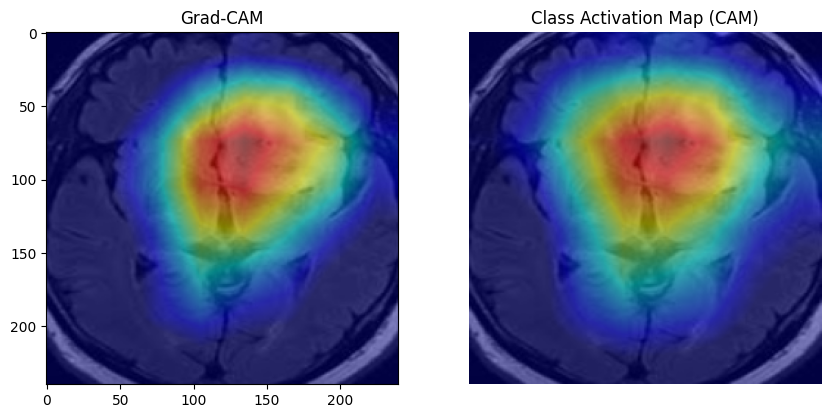

In [33]:
# Load image for testing
test_img = cv2.imread("/kaggle/working/testing_data/glioma_tumor/4.jpg")

# Apply Grad-CAM
plt.figure(figsize=(10, 5))
plt.subplot(1, 2, 1)
plt.title("Grad-CAM")
VizGradCAM(model, img_to_array(test_img), plot_results=True)

# Apply CAM
plt.subplot(1, 2, 2)
plt.title("CAM")
VizCAM(model, img_to_array(test_img), plot_results=True)


## Compile base Model With Grad-CAM

In [34]:
# Load EfficientNetB1
base_model = EfficientNetB1(weights='imagenet', include_top=False, input_shape=(240, 240, 3))

# Freeze base model layers
# for layer in base_model.layers:
#    layer.trainable = False

x = base_model.output
x = Flatten()(x) 
x = Dense(512, activation='relu')(x)  
output = Dense(4, activation='softmax')(x)

model = Model(inputs=base_model.input, outputs=output)

model.summary()


Model: "functional_3"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)              ┃ Output Shape           ┃        Param # ┃ Connected to           ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━┩
│ input_layer_1             │ (None, 240, 240, 3)    │              0 │ -                      │
│ (InputLayer)              │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ rescaling_2 (Rescaling)   │ (None, 240, 240, 3)    │              0 │ input_layer_1[0][0]    │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ normalization_1           │ (None, 240, 240, 3)    │              7 │ rescaling_2[0][0]      │
│ (Normalization)           │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ rescaling_3 (Rescaling)   │ (None, 240, 240, 3)    │              0 │ normalization_1[0][0]  │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ stem_conv_pad             │ (None, 241, 241, 3)    │              0 │ rescaling_3[0][0]      │
│ (ZeroPadding2D)           │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ stem_conv (Conv2D)        │ (None, 120, 120, 32)   │            864 │ stem_conv_pad[0][0]    │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ stem_bn                   │ (None, 120, 120, 32)   │            128 │ stem_conv[0][0]        │
│ (BatchNormalization)      │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ stem_activation           │ (None, 120, 120, 32)   │              0 │ stem_bn[0][0]          │
│ (Activation)              │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ block1a_dwconv            │ (None, 120, 120, 32)   │            288 │ stem_activation[0][0]  │
│ (DepthwiseConv2D)         │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ block1a_bn                │ (None, 120, 120, 32)   │            128 │ block1a_dwconv[0][0]   │
│ (BatchNormalization)      │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ block1a_activation        │ (None, 120, 120, 32)   │              0 │ block1a_bn[0][0]       │
│ (Activation)              │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ block1a_se_squeeze        │ (None, 32)             │              0 │ block1a_activation[0]… │
│ (GlobalAveragePooling2D)  │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ block1a_se_reshape        │ (None, 1, 1, 32)       │              0 │ block1a_se_squeeze[0]… │
│ (Reshape)                 │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ block1a_se_reduce         │ (None, 1, 1, 8)        │            264 │ block1a_se_reshape[0]… │
│ (Conv2D)                  │                        │                │                        │
├──────────────────────

 Total params: 48,520,843 (185.09 MB)

 Trainable params: 48,458,788 (184.86 MB)

 Non-trainable params: 62,055 (242.41 KB)

dot: graph is too large for cairo-renderer bitmaps. Scaling by 0.286786 to fit



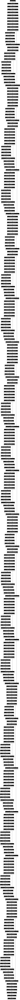

In [35]:
plot_model(model, to_file='model_architecture_2.png', show_shapes=True, show_layer_names=True)

In [36]:
#define checkpoint
checkpoint = ModelCheckpoint('model_2.keras', 
                             monitor='val_accuracy',
                             save_best_only=True,
                             mode='auto',
                             verbose=1)

#early stopping
earlystop = EarlyStopping(monitor='val_accuracy',
                          patience=5,
                          mode='auto',
                          verbose=1)

#reduce learning rate
reduce_lr = ReduceLROnPlateau(monitor='val_accuracy', 
                              factor=0.3, 
                              patience=2, 
                              min_delta=0.001,
                              mode='auto',
                              verbose=1)

#compile model
model.compile(optimizer=Adam(learning_rate=0.0001),
              loss='categorical_crossentropy',
              metrics=['accuracy'])


In [37]:
%%time

#train the model
history = model.fit(train_data,
                    epochs = 30,
                    validation_data=valid_data,
                    verbose=1,
                    callbacks=[checkpoint, earlystop, reduce_lr])

Epoch 1/30
82/82 ━━━━━━━━━━━━━━━━━━━━ 0s 1s/step - accuracy: 0.6590 - loss: 1.1544
Epoch 1: val_accuracy improved from -inf to 0.64417, saving model to model_2.keras
82/82 ━━━━━━━━━━━━━━━━━━━━ 197s 1s/step - accuracy: 0.6602 - loss: 1.1497 - val_accuracy: 0.6442 - val_loss: 0.9947 - learning_rate: 1.0000e-04
Epoch 2/30
82/82 ━━━━━━━━━━━━━━━━━━━━ 0s 341ms/step - accuracy: 0.8968 - loss: 0.2952
Epoch 2: val_accuracy improved from 0.64417 to 0.72086, saving model to model_2.keras
82/82 ━━━━━━━━━━━━━━━━━━━━ 42s 477ms/step - accuracy: 0.8970 - loss: 0.2946 - val_accuracy: 0.7209 - val_loss: 0.8369 - learning_rate: 1.0000e-04
Epoch 3/30
82/82 ━━━━━━━━━━━━━━━━━━━━ 0s 337ms/step - accuracy: 0.9492 - loss: 0.1492
Epoch 3: val_accuracy improved from 0.72086 to 0.76994, saving model to model_2.keras
82/82 ━━━━━━━━━━━━━━━━━━━━ 42s 474ms/step - accuracy: 0.9492 - loss: 0.1492 - val_accuracy: 0.7699 - val_loss: 0.6650 - learning_rate: 1.0000e-04
Epoch 4/30
82/82 ━━━━━━━━━━━━━━━━━━━━ 0s 342ms/step - 

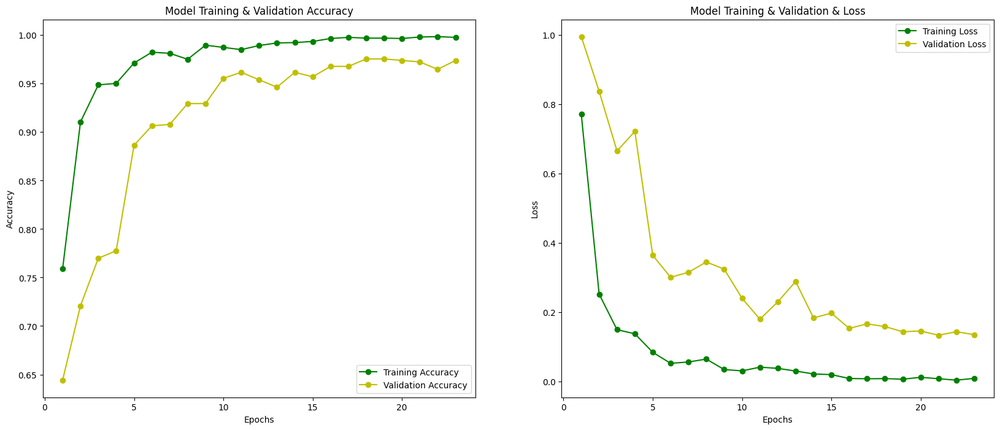

In [38]:
fig , ax = plt.subplots(1,2)
fig.set_size_inches(20, 8)

train_acc = history.history['accuracy']
train_loss = history.history['loss']
val_acc = history.history['val_accuracy']
val_loss = history.history['val_loss']

epochs = range(1, len(train_acc) + 1)

ax[0].plot(epochs , train_acc , 'g-o' , label = 'Training Accuracy')
ax[0].plot(epochs , val_acc , 'y-o' , label = 'Validation Accuracy')
ax[0].set_title('Model Training & Validation Accuracy')
ax[0].legend(loc = 'lower right')
ax[0].set_xlabel("Epochs")
ax[0].set_ylabel("Accuracy")

ax[1].plot(epochs , train_loss , 'g-o' , label = 'Training Loss')
ax[1].plot(epochs , val_loss , 'y-o' , label = 'Validation Loss')
ax[1].set_title('Model Training & Validation & Loss')
ax[1].legend()
ax[1].set_xlabel("Epochs")
ax[1].set_ylabel("Loss")

plt.show()

In [39]:
import PIL

class_dict = {0: 'glioma_tumor',
              1: 'meningioma_tumor',
              2: 'no_tumor',
              3: 'pituitary_tumor'}
              
prediction = []
original = []
image = []
count = 0
for i in os.listdir('/kaggle/working/testing_data'):
  for item in os.listdir(os.path.join('/kaggle/working/testing_data', i)):
    # code to open the image
    img= PIL.Image.open(os.path.join('/kaggle/working/testing_data', i, item))
    #append to image list
    image.append(img)
    #expand dimension
    img = np.expand_dims(img, axis=0)
    #predict
    predict = model.predict(img)
    #get the index corresponding to the highest value in the prediction
    predict = np.argmax(predict)
    #append the predicted class to the list
    prediction.append(class_dict[predict])
    #append original class to the list
    original.append(i)

1/1 ━━━━━━━━━━━━━━━━━━━━ 7s 7s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step


In [40]:

#test accuracy 
score = accuracy_score(original, prediction)
print("Test Accuracy : {}".format(score))

Test Accuracy : 1.0


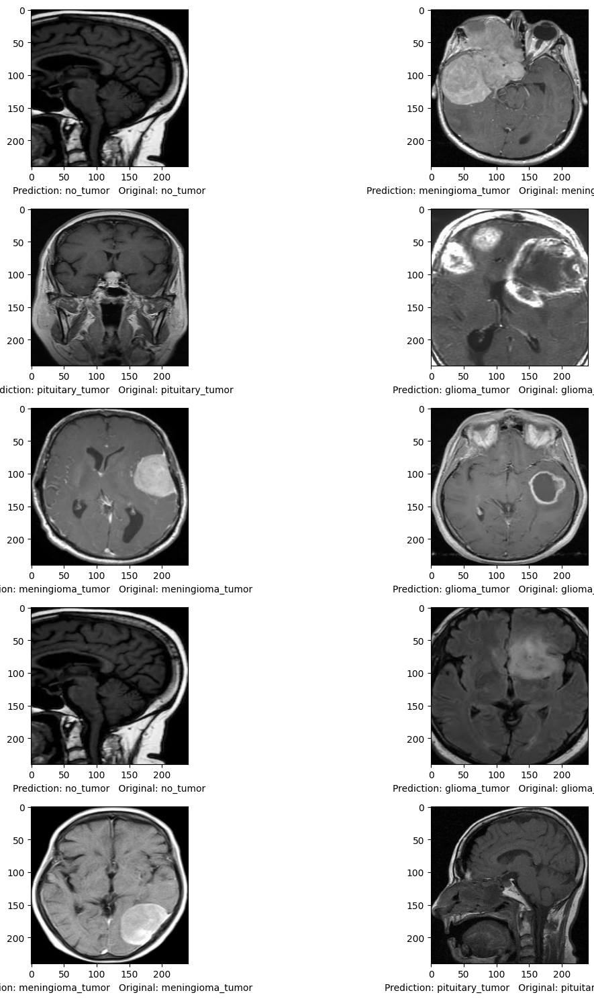

In [41]:
# Visualize the results
fig = plt.figure(figsize=(15, 15))
for i in range(10):
    j = random.randint(0, len(image) - 1) 
    fig.add_subplot(5, 2, i + 1)
    plt.xlabel(f"Prediction: {prediction[j]}   Original: {original[j]}")
    plt.imshow(image[j])
fig.tight_layout()
plt.show()

1/1 ━━━━━━━━━━━━━━━━━━━━ 7s 7s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step


ValueError: shapes (8,8,1280) and (512,) not aligned: 1280 (dim 2) != 512 (dim 0)

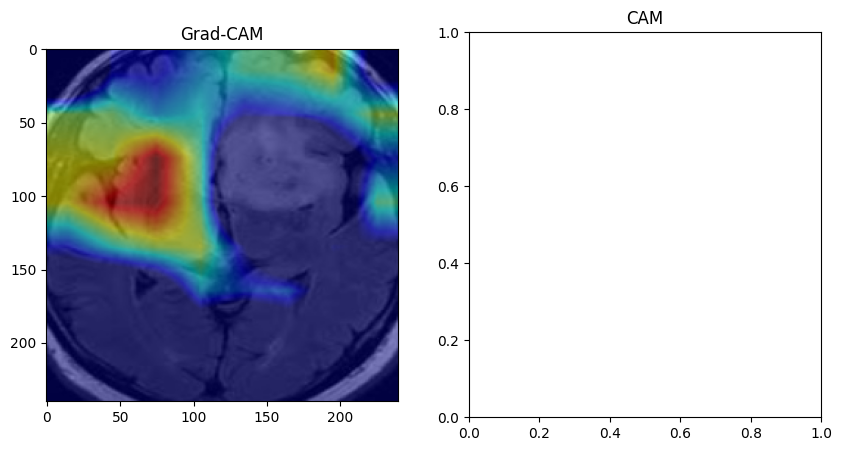

In [42]:
# Load image for testing
test_img = cv2.imread("/kaggle/working/testing_data/glioma_tumor/4.jpg")

# Apply Grad-CAM
plt.figure(figsize=(10, 5))
plt.subplot(1, 2, 1)
plt.title("Grad-CAM")
VizGradCAM(model, img_to_array(test_img), plot_results=True)

# Apply CAM
plt.subplot(1, 2, 2)
plt.title("CAM")
VizCAM(model, img_to_array(test_img), plot_results=True)
